In [67]:
import pandas as pd 
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [68]:

df = pd.read_csv("Datasets/ACE_Violations_PostConj.csv")
df_speeds = pd.read_csv("Datasets/BusSpeeds2025.csv")
df_speeds2 = pd.read_csv("Datasets/BusSpeeds2024.csv")

In [69]:
print(df_speeds.columns)

Index(['Year', 'Month', 'Timestamp', 'Day of Week', 'Hour of Day', 'Route ID',
       'Direction', 'Borough', 'Route Type', 'Stop Order', 'Timepoint Stop ID',
       'Timepoint Stop Name', 'Timepoint Stop Latitude',
       'Timepoint Stop Longitude', 'Next Timepoint Stop ID',
       'Next Timepoint Stop Name', 'Next Timepoint Stop Latitude',
       'Next Timepoint Stop Longitude', 'Road Distance', 'Average Travel Time',
       'Average Road Speed', 'Bus Trip Count', 'Timepoint Stop Georeference',
       'Next Timepoint Stop Georeference'],
      dtype='object')


In [70]:
# Convert violations DataFrame → GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["Violation Longitude"], df["Violation Latitude"]),
    crs="EPSG:4326"  # Tells geopandas how coordinates interperted on earth
)

In [71]:
# Loading in the boundaries for congestion zone in Central Business District
region = gpd.read_file("map.geojson")

In [72]:
# Getting the violations that are in congestion zone only
violations_in_region = gpd.sjoin(gdf, region, how="inner", predicate="within")

In [73]:
# Printing the basic information we can gather from this dataset
unique_buses = violations_in_region["Bus Route ID"].unique()
print("Total violations in dataset:", len(df))
print("Violations inside region:", len(violations_in_region))
print("Buses with violations in CBD:", unique_buses)
for bus in unique_buses:
    bus_violations = violations_in_region[violations_in_region["Bus Route ID"] == bus]
    print(f"Total violations on {bus} route: {len(bus_violations)}")

Total violations in dataset: 187607
Violations inside region: 15178
Buses with violations in CBD: ['M42' 'M101' 'M15+' 'M14+' 'M34+' 'M23+' 'M2' 'M4']
Total violations on M42 route: 1827
Total violations on M101 route: 2613
Total violations on M15+ route: 6809
Total violations on M14+ route: 1206
Total violations on M34+ route: 647
Total violations on M23+ route: 525
Total violations on M2 route: 1533
Total violations on M4 route: 18


In [74]:
import folium

# Get the center of the region to focus the map
center_lat = violations_in_region["Violation Latitude"].mean()
center_lon = violations_in_region["Violation Longitude"].mean()

# Create a folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Add polygon boundary (CBD)
folium.GeoJson("map.geojson", name="CBD").add_to(m)

# Add violations as points
for idx, row in violations_in_region.iterrows():
    folium.CircleMarker(
        location=[row["Violation Latitude"], row["Violation Longitude"]],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.5
    ).add_to(m)

# Display map
m

In [75]:
from folium.plugins import HeatMap

# List of specific Route IDs to map
selected_routes = ['M15+', 'M14+', 'M34+', 'M23+']

# Filter the violations for only the selected routes
violations_selected = violations_in_region[violations_in_region["Bus Route ID"].isin(selected_routes)]

# Get the center of the region
center_lat = violations_selected["Violation Latitude"].mean()
center_lon = violations_selected["Violation Longitude"].mean()

# Create a folium map
m_heat = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Add polygon boundary (CBD)
folium.GeoJson("map.geojson", name="CBD").add_to(m_heat)

# Prepare data for heatmap: list of [lat, lon] pairs
heat_data = violations_selected[['Violation Latitude', 'Violation Longitude']].values.tolist()

# Add heatmap layer
HeatMap(heat_data, radius=10, blur=15, max_zoom=15).add_to(m_heat)

# Display map
m_heat


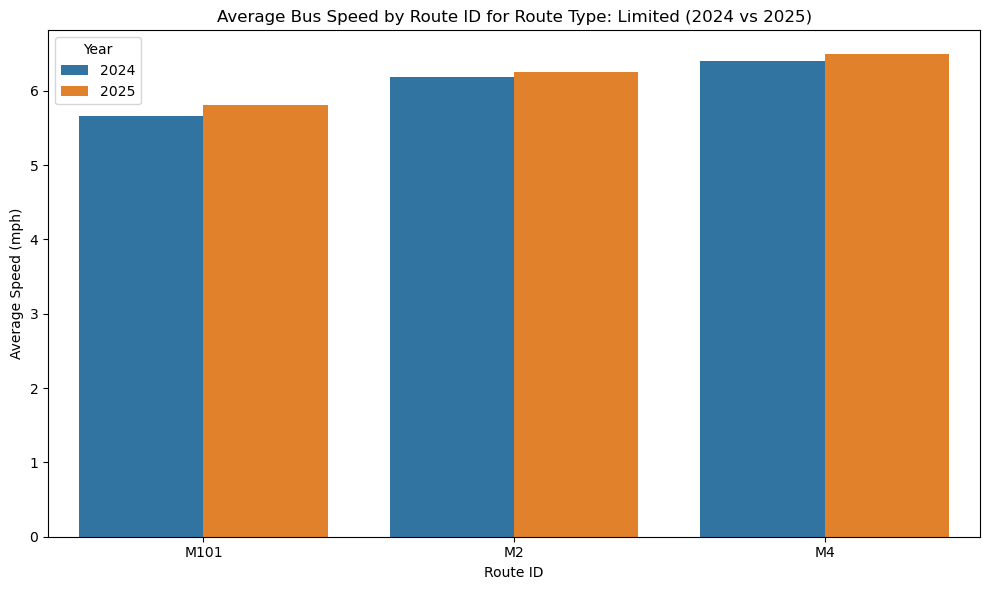

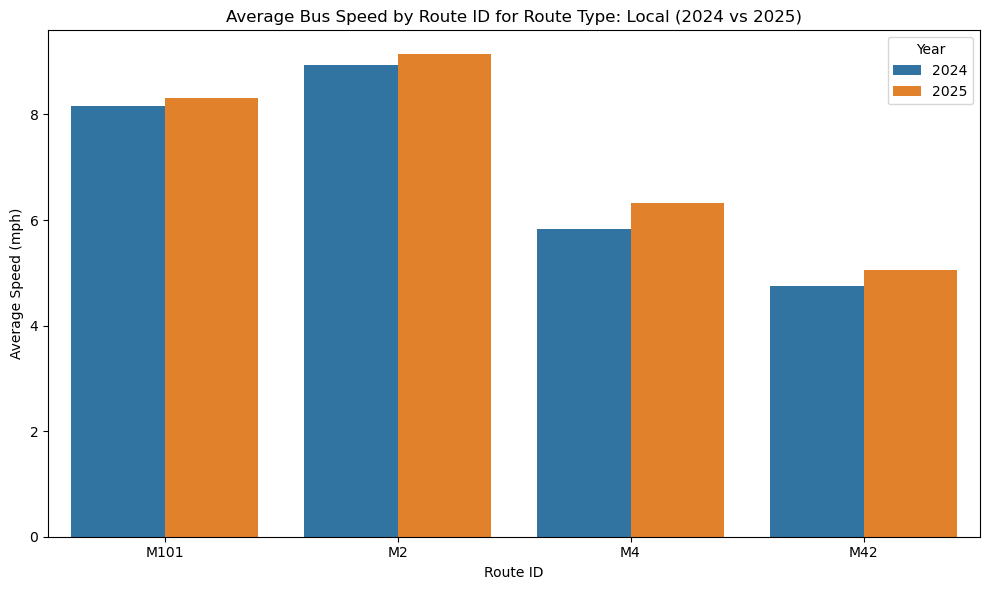

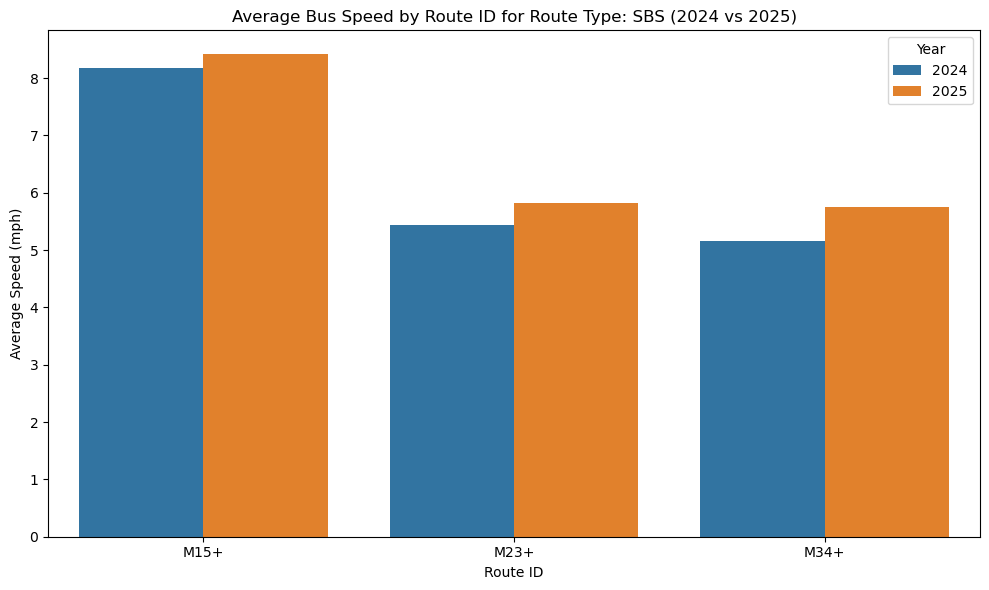

In [76]:
# Group by Route Type and Route ID, compute average speed across all months
avg_speed_2025 = (
    df_speeds_2025
    .groupby(["Route Type", "Route ID"])["Average Road Speed"]
    .mean()
    .reset_index()
)
avg_speed_2024 = (
    df_speeds_2024
    .groupby(["Route Type", "Route ID"])["Average Road Speed"]
    .mean()
    .reset_index()
)

# Add a column to distinguish year
avg_speed_2025["Data Year"] = "2025"
avg_speed_2024["Data Year"] = "2024"

# Combine both datasets
avg_speed_all = pd.concat([avg_speed_2024, avg_speed_2025])

# Plot separately for each Route Type
route_types = avg_speed_all["Route Type"].unique()

for rtype in route_types:
    plt.figure(figsize=(10,6))
    df_subset = avg_speed_all[avg_speed_all["Route Type"] == rtype]
    
    # Barplot: X = Route ID, Y = Avg Speed, hue = Year
    sns.barplot(
        data=df_subset,
        x="Route ID",
        y="Average Road Speed",
        hue="Data Year",
        errorbar=None
    )
    
    plt.title(f"Average Bus Speed by Route ID for Route Type: {rtype} (2024 vs 2025)")
    plt.xlabel("Route ID")
    plt.ylabel("Average Speed (mph)")
    plt.legend(title="Year")
    plt.tight_layout()
    plt.show()

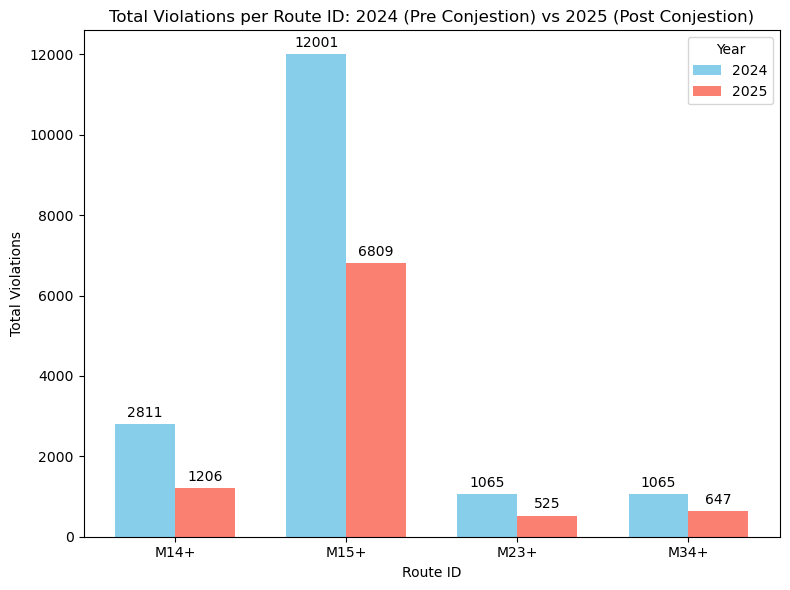

In [77]:

route_ids = ["M14+", "M15+", "M23+", "M34+"]  # X-axis labels
violations_2024 = [2811, 12001, 1065, 1065]        # Hard coded values we got from 2024 data
violations_2025 = [1206, 6809, 525, 647]         # Hard coded values we got from 2025 data

# Set up the bar positions
x = np.arange(len(route_ids))  # the label locations
width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(8,6))

# Plot bars for 2024 and 2025
rects1 = ax.bar(x - width/2, violations_2024, width, label="2024", color="skyblue")
rects2 = ax.bar(x + width/2, violations_2025, width, label="2025", color="salmon")

# Labels and Titles
ax.set_ylabel("Total Violations")
ax.set_xlabel("Route ID")
ax.set_title("Total Violations per Route ID: 2024 (Pre Conjestion) vs 2025 (Post Conjestion)")
ax.set_xticks(x)
ax.set_xticklabels(route_ids)
ax.legend(title="Year")

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0,3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

plt.tight_layout()
plt.show()


In [78]:
# Calulating percentage decreases for each year:
percentages = []
for i in range(len(violations_2024)):
    percentages.append(violations_2025[i] / violations_2024[i])
    print(f"Violations for {route_ids[i]} decreased by {round(percentages[i] * 100, 2)}%")
average_percentages = round(sum(percentages) / len(percentages) * 100, 2)
print(f"The violations post conjestion had decreased about {average_percentages}% on average.")

Violations for M14+ decreased by 42.9%
Violations for M15+ decreased by 56.74%
Violations for M23+ decreased by 49.3%
Violations for M34+ decreased by 60.75%
The violations post conjestion had decreased about 52.42% on average.
